In [10]:
import pandas as pd
import json
import os

from sdv.metadata import Metadata
from sdv.evaluation.single_table import get_column_plot, get_column_pair_plot

In [11]:
# config
DATASET = "adult"
SYN_MODEL = "vae-bgm"

output_folder_cat = f"../results/plots/{DATASET}/{SYN_MODEL}/categorial"
output_folder_num = f"../results/plots/{DATASET}/{SYN_MODEL}/numerical"

#os.makedirs(output_folder_cat, exist_ok=True)
#os.makedirs(output_folder_num, exist_ok=True)

In [12]:
real_path = f"../data/processed/{DATASET}/train_balanced.csv"
syn_path = "../sdg-models/vae-bgm/data_generation/output_generator/adult/bgm/5_50/seed_0/raw_gen_data.csv"


df_real = pd.read_csv(real_path)
df_syn = pd.read_csv(syn_path)

# load info json
#with open("../sdg-models/tabsyn/data/info/adult.json", "r") as f:
#        info = json.load(f)

In [13]:
metadata = Metadata.detect_from_dataframe(df_real)

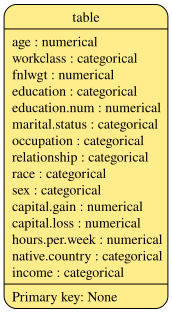

In [14]:
metadata.visualize()

In [18]:
# adult
cat_cols = ['workclass', 'education', 'marital.status', 'occupation', 'relationship', 'race', 'sex', 'native.country', 'income']
#num_cols = ['age', 'fnlwgt', 'education.num', 'capital.gain', 'capital.loss', 'hours.per.week']
num_cols = ['age', 'fnlwgt', 'capital.gain', 'capital.loss', 'hours.per.week']

# yeast
#num_cols = ["mcg", "gvh", "alm", "mit", "erl", "pox", "vac", "nuc"]

## Plots for categorical Columns

In [16]:
for col in cat_cols:
    fig_cat = get_column_plot(
    real_data = df_real,
    synthetic_data = df_syn,
    metadata = metadata,
    column_name = col 
    )
    #fig_cat.write_image(f"{output_folder_cat}/{col}.png")
    fig_cat.show()

## Plots for Continous Columns

In [19]:
for col in num_cols:
    fig_num = get_column_plot(
        real_data = df_real,
        synthetic_data = df_syn,
        metadata = metadata,
        column_name = col 
    )
    #fig_cat.write_image(f"{output_folder_num}/{col}.png")
    fig_num.show()